In [31]:
#import the necessary labraries 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
import numpy as np
from scipy import stats
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')


# Task 1: Data Preprocessing and EDA


###  Data loading 


In [32]:
#dataset is loaded using .read_excel
data = pd.read_excel('EastWestAirlines.xlsx', sheet_name = 'data')
data.head()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1


In [33]:
data.shape

(3999, 12)

In [34]:
#since we are going to make diffierents we can make copy of the data. so in futur we can use orignal data as it is for different model
df = data.copy()
df.head()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1


In [35]:
# find the number of missing values 
df.isnull().sum()
#we can see that their are 0 missing values in our dataset

ID#                  0
Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award?               0
dtype: int64

In [36]:
#first identify the categorical features in our dataset 
df.dtypes
#we can see we don't any categorical feature since all the dataset having int64 data types 

ID#                  int64
Balance              int64
Qual_miles           int64
cc1_miles            int64
cc2_miles            int64
cc3_miles            int64
Bonus_miles          int64
Bonus_trans          int64
Flight_miles_12mo    int64
Flight_trans_12      int64
Days_since_enroll    int64
Award?               int64
dtype: object

### Outliers Handling 

#### Box Plot 

In [38]:
# Create a box plot for each column to see if there outliers present or not in the features 
fig = px.box(df, points='outliers')
fig.show()

##### Box Plot Analysis

- The box plot reveals the distribution of values for each feature, showing potential outliers in features like **Balance**, **Bonus_miles***, and **Flight_miles_12mo**.

-  Notable outliers suggest that some customers have exceptionally high values, which may indicate unique behaviors or data entry errors.


In [39]:
#### Histogram 

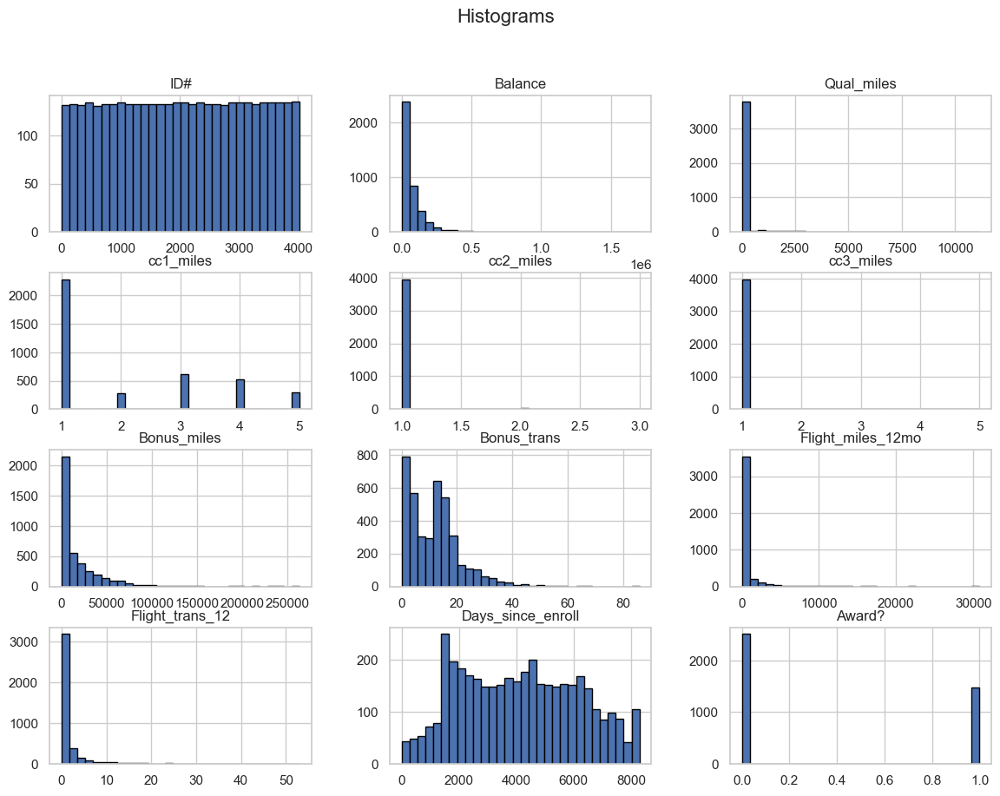

In [40]:
 #Create histograms to visualize the distributions of various numerical variables.
# Plot histograms for all columns
sns.set(style="whitegrid")

# Plot histograms for numerical variables
df.hist(figsize=(14, 10), bins=30, edgecolor='black')
plt.suptitle('Histograms', fontsize=16)
plt.show()


The histograms reveal that several features in the dataset are highly skewed. For instance, Balance, Bonus_miles, and Days_since_enroll show a right-skewed distribution, indicating that a majority of customers have lower values, with a few having exceptionally high values.

#### IQR (Otliers handling techniques)


In [41]:
# Function to handle outliers using IQR method
def handle_outliers(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return series.clip(lower_bound, upper_bound)
cleaned_df
# Handle outliers for each feature
cleaned_df = df.drop(columns=['ID#']).apply(handle_outliers)
.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,28143.0,0,1,1,1,174.0,1,0.0,0.0,7000,0
1,19244.0,0,1,1,1,215.0,2,0.0,0.0,6968,0
2,41354.0,0,1,1,1,4123.0,4,0.0,0.0,7034,0
3,14776.0,0,1,1,1,500.0,1,0.0,0.0,6952,0
4,97752.0,0,4,1,1,43300.0,26,777.5,2.5,6935,1


#### Box plot After Handling the Outliers 


In [42]:
# Create a box plot for each column
fig = px.box(cleaned_df, points='outliers')
fig.show()

**The box plot confirms the presence of outliers in the feature have been capped**

## Visualization of dataset 


### Count Plot 


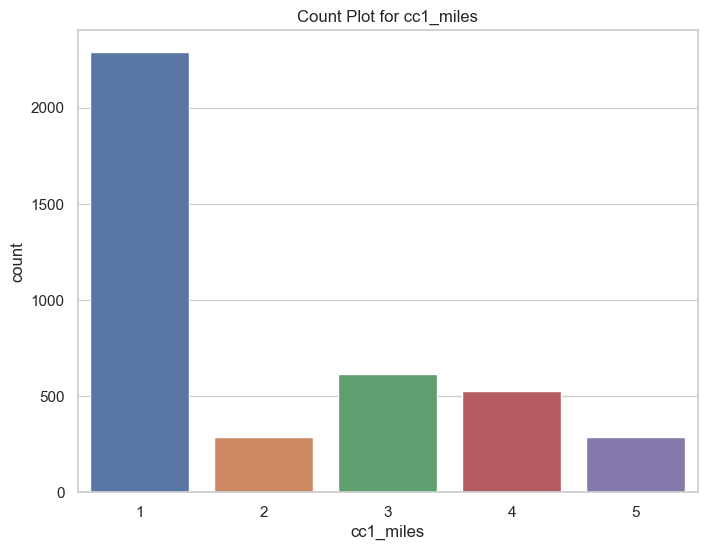

In [45]:
# Count plot for 'cc1_miles' to check the count distrution in each category 
plt.figure(figsize=(8, 6))
sns.countplot(x='cc1_miles', data=cleaned_df)
plt.title('Count Plot for cc1_miles')
plt.show()

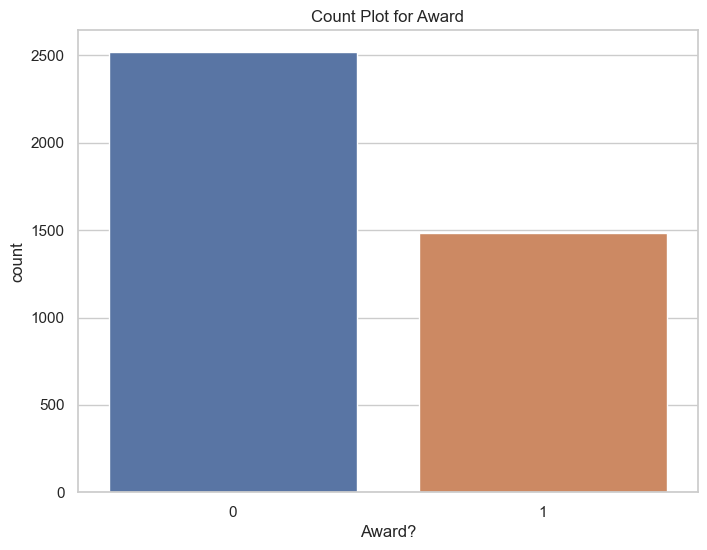

In [46]:
# Count plot for 'Award'
plt.figure(figsize=(8, 6))
sns.countplot(x='Award?', data=cleaned_df)
plt.title('Count Plot for Award')
plt.show()

## Heatmap 

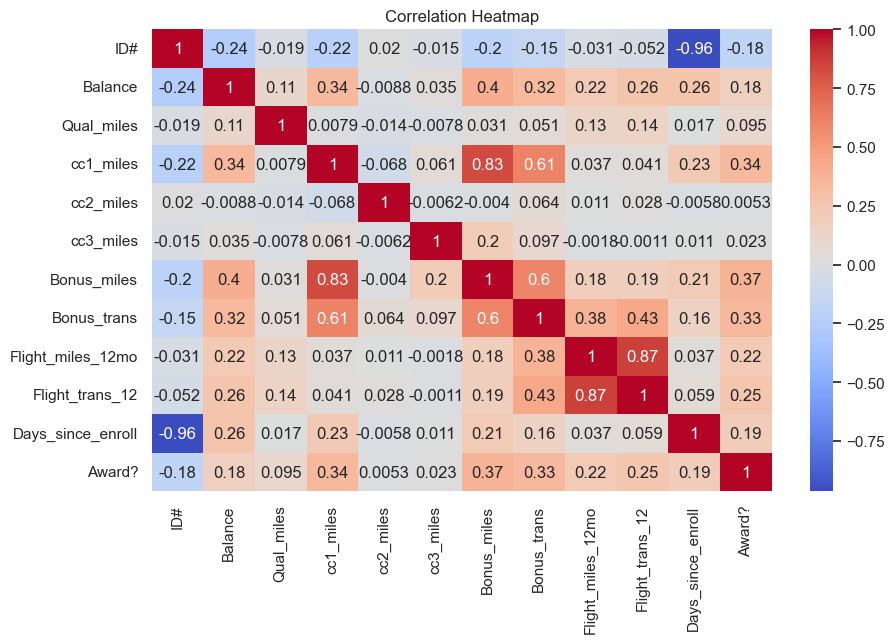

In [49]:
# Correlation heatmap to find the relation between features 
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

- **Key Relationships Identified**: Strong negative correlation (-0.96) between ID# and Days_since_enroll suggests that older customers (lower ID#) tend to be enrolled longer. Conversely, a strong positive correlation (0.83) between cc1_miles and Bonus_miles indicates frequent flyer credit card use is linked to earning bonus miles.
  
- **Implications for Clustering**: The moderate correlations among Bonus_miles, Bonus_trans, and cc1_miles suggest that these features might provide redundant information in clustering.

- **Potential for Well-Separated Clusters**: The overall lack of strong correlations between most variables indicates the dataset is likely to produce distinct clusters. 

### Pair PLot 

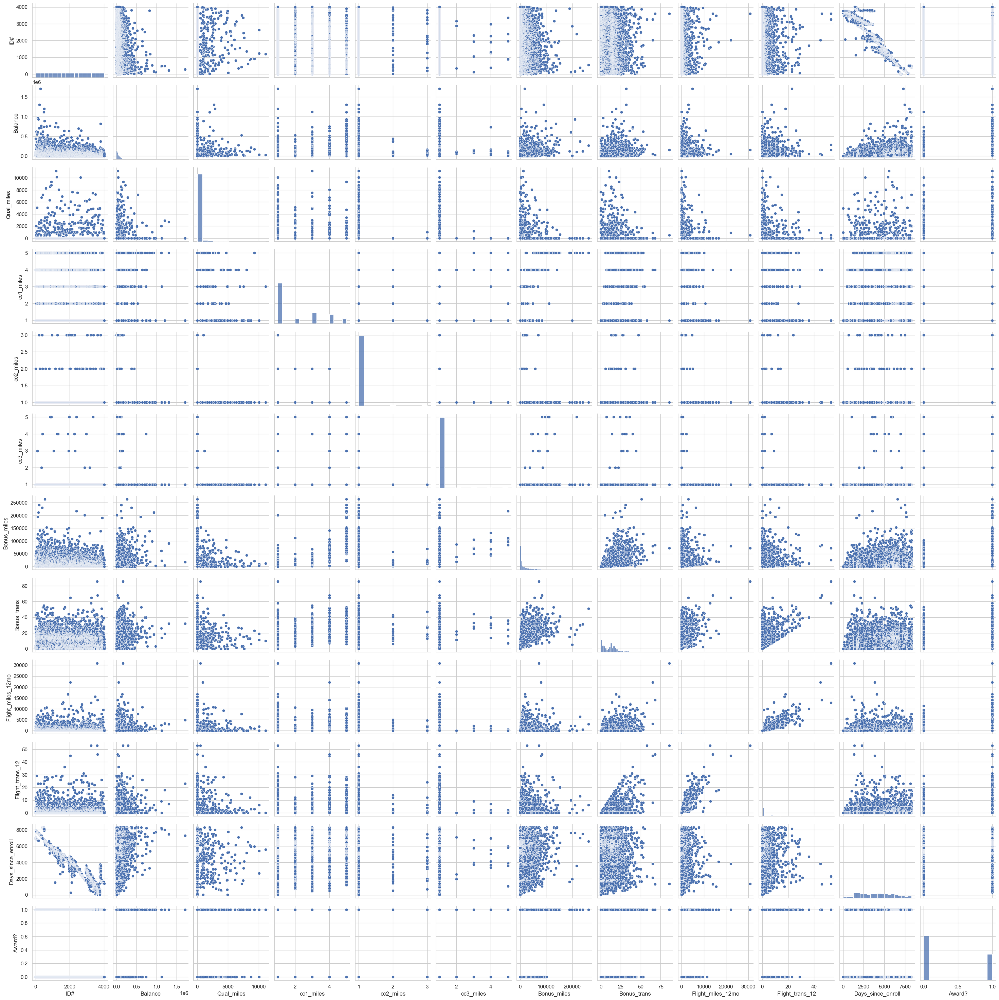

In [52]:
sns.pairplot(df)
plt.show()

- **Key Relationships Observed**: The pair plot confirms strong positive correlations, particularly between Bonus_miles and cc1_miles, as well as Flight_trans_12 and Flight_miles_12mo. This supports findings from the heatmap, emphasizing the importance of these features in clustering.

- **Outlier Identification and Treatment**: Several potential outliers were detected in features like Balance and Bonus_miles. Addressing these outliers is crucial for improving clustering performance, as they could skew results.

- **Feature Selection and Standardization**: Given the strong correlations among Bonus_miles, cc1_miles, and Bonus_trans.


## feature Scaling 

In [53]:
#import preprocessing libraries 
from sklearn.preprocessing import MinMaxScaler

In [54]:
# Initialize the MinMax scaler
scaler = MinMaxScaler()

# Apply scaling to the dataframe
scaled_df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Display the first few rows of the scaled dataframe
scaled_df.head()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,0.000000,0.016508,0.0,0.00,0.0,0.0,0.000660,0.011628,0.000000,0.000000,0.843742,0.0
1,0.000249,0.011288,0.0,0.00,0.0,0.0,0.000815,0.023256,0.000000,0.000000,0.839884,0.0
2,0.000498,0.024257,0.0,0.00,0.0,0.0,0.015636,0.046512,0.000000,0.000000,0.847842,0.0
3,0.000746,0.008667,0.0,0.00,0.0,0.0,0.001896,0.011628,0.000000,0.000000,0.837955,0.0
4,0.000995,0.057338,0.0,0.75,0.0,0.0,0.164211,0.302326,0.067398,0.075472,0.835905,1.0


In [55]:
scaled_df.drop(columns = 'ID#', inplace = True)

In [56]:
scaled_df

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,0.016508,0.0,0.00,0.0,0.0,0.000660,0.011628,0.000000,0.000000,0.843742,0.0
1,0.011288,0.0,0.00,0.0,0.0,0.000815,0.023256,0.000000,0.000000,0.839884,0.0
2,0.024257,0.0,0.00,0.0,0.0,0.015636,0.046512,0.000000,0.000000,0.847842,0.0
3,0.008667,0.0,0.00,0.0,0.0,0.001896,0.011628,0.000000,0.000000,0.837955,0.0
4,0.057338,0.0,0.75,0.0,0.0,0.164211,0.302326,0.067398,0.075472,0.835905,1.0
...,...,...,...,...,...,...,...,...,...,...,...
3994,0.010837,0.0,0.00,0.0,0.0,0.032330,0.046512,0.006490,0.018868,0.168917,1.0
3995,0.037766,0.0,0.00,0.0,0.0,0.003720,0.058140,0.000000,0.000000,0.167953,1.0
3996,0.043169,0.0,0.50,0.0,0.0,0.096505,0.093023,0.000000,0.000000,0.168797,1.0
3997,0.032202,0.0,0.00,0.0,0.0,0.001896,0.011628,0.016225,0.018868,0.168676,0.0


# Implementing Clustering Algorithms on Orignal Dataset 

## K-means Clustering 

In [57]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from scipy.cluster.hierarchy import dendrogram, linkage

In [58]:
# K-Means Clustering
kmeans = KMeans(n_clusters=3, random_state=42)
scaled_df['KMeans_Cluster'] = kmeans.fit_predict(scaled_df)

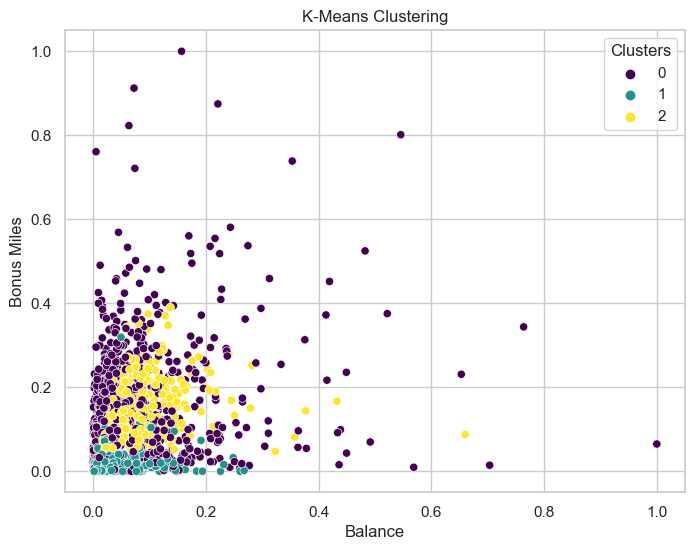

In [59]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Balance', y='Bonus_miles', hue='KMeans_Cluster', palette='viridis', data=scaled_df)
plt.title('K-Means Clustering')
plt.xlabel('Balance')
plt.ylabel('Bonus Miles')
plt.legend(title='Clusters')
plt.show()

- **Three Clusters Identified**:
  - **Cluster 0 (Purple)**: Largest group with low Balance and Bonus Miles; likely infrequent users.
  - **Cluster 1 (Green)**: Smallest group with minimal engagement; may represent new or inactive customers.
  - **Cluster 2 (Yellow)**: More engaged customers with moderate balances and bonus miles.

- **Outliers**: High Bonus Miles in Cluster 0 may indicate high-spending customers using non-flight activities.

- **Skewed Distribution**: Most customers have low balances and bonus miles, with few outliers raising the average.

## Hierarchical Clustering

In [68]:
# Hierarchical Clustering
hierarchical = AgglomerativeClustering(n_clusters=3)
scaled_df['Hierarchical_Cluster'] = hierarchical.fit_predict(scaled_df)


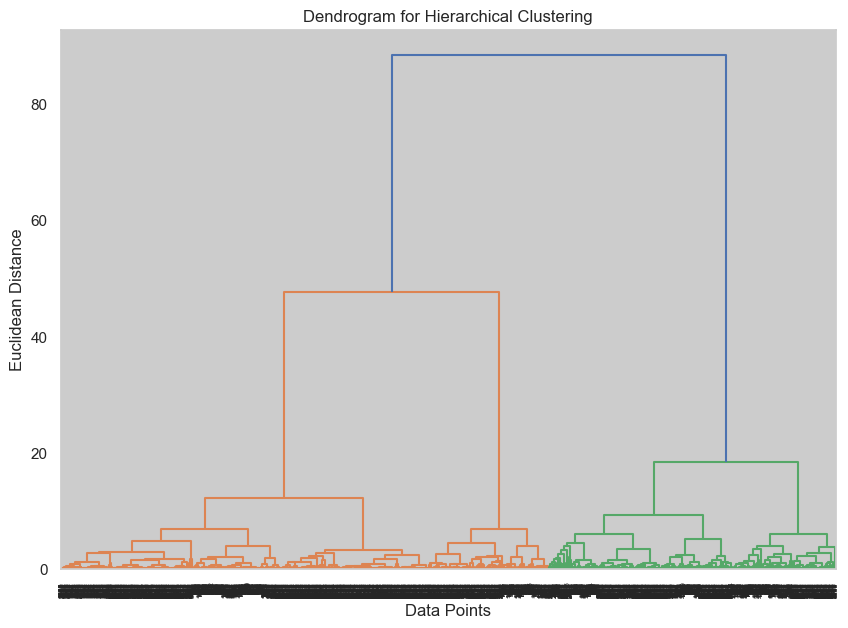

In [61]:
linked = linkage(scaled_df, method='ward')
plt.figure(figsize=(10, 7))
dendrogram(linked, 
           orientation='top', 
           labels=scaled_df.index,
           distance_sort='descending',
           show_leaf_counts=True)
plt.title('Dendrogram for Hierarchical Clustering')
plt.xlabel('Data Points')
plt.ylabel('Euclidean Distance')
plt.show()

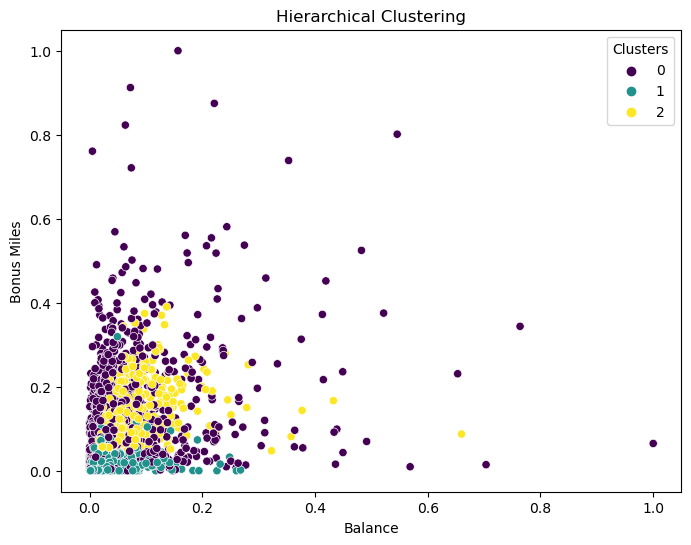

In [15]:
# Hierarchical Clustering Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Balance', y='Bonus_miles', hue='Hierarchical_Cluster', palette='viridis', data=scaled_df)
plt.title('Hierarchical Clustering')
plt.xlabel('Balance')
plt.ylabel('Bonus Miles')
plt.legend(title='Clusters')
plt.show()

**We can see that the hierarchial clustering scatter plot is similar to the k-menas scatter plot**

## DBSCAN Clustering


In [62]:
# DBSCAN Clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
scaled_df['DBSCAN_Cluster'] = dbscan.fit_predict(scaled_df)

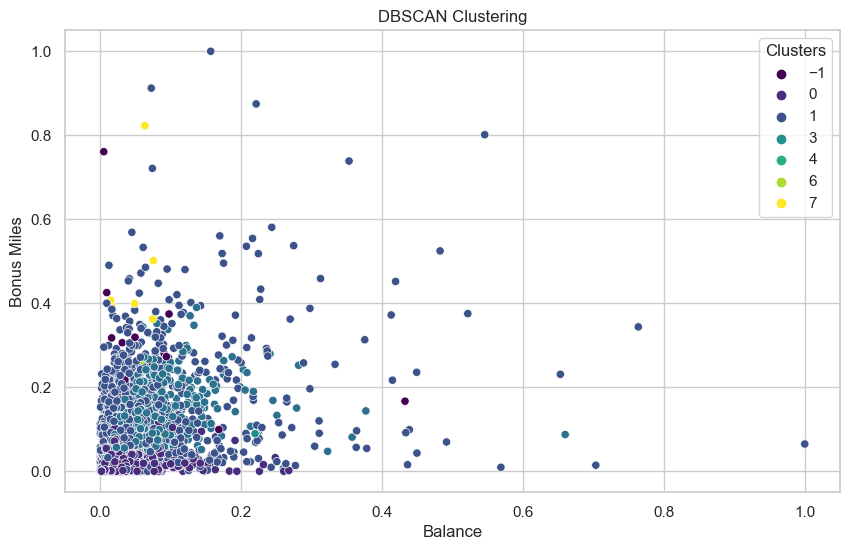

In [63]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Balance', y='Bonus_miles', hue='DBSCAN_Cluster', palette='viridis', data=scaled_df)
plt.title('DBSCAN Clustering')
plt.xlabel('Balance')
plt.ylabel('Bonus Miles')
plt.legend(title='Clusters')
plt.show()

- **Noise Points (Cluster -1)**: The purple points indicate noise or outliers detected by DBSCAN, scattered in areas of higher Balance and Bonus Miles. These points exhibit atypical behavior compared to the rest of the data.

- **Dense Cluster (Cluster 0)**: The blue cluster is densely packed around low Balance and Bonus Miles values, representing the majority of customers with low balances and few bonus miles.

- **Smaller Clusters**: Clusters 1, 3, 4, 6, and 7 highlight segments with slightly higher balances and bonus miles than Cluster 0.

# Optimization

### K-means (Elbow curve for different K values)

In [64]:
from sklearn.metrics import silhouette_score

In [65]:
# Elbow method for K-Means
sse = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_df)
    sse.append(kmeans.inertia_)

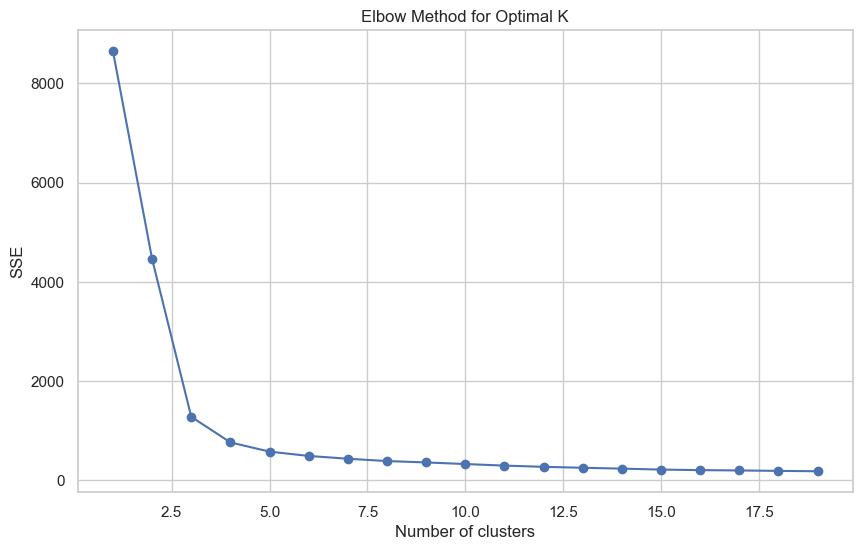

In [66]:
# Plot the Elbow curve
plt.figure(figsize=(10, 6))
plt.plot(range(1, 20), sse, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.title('Elbow Method for Optimal K')
plt.show()

**The elbow method indicates that 4 clusters (K=4) is the most appropriate choice for K-means clustering in this case, as it captures the main data structure while avoiding over-complicatio**

### linkage criteria for Hierarchical Clustering

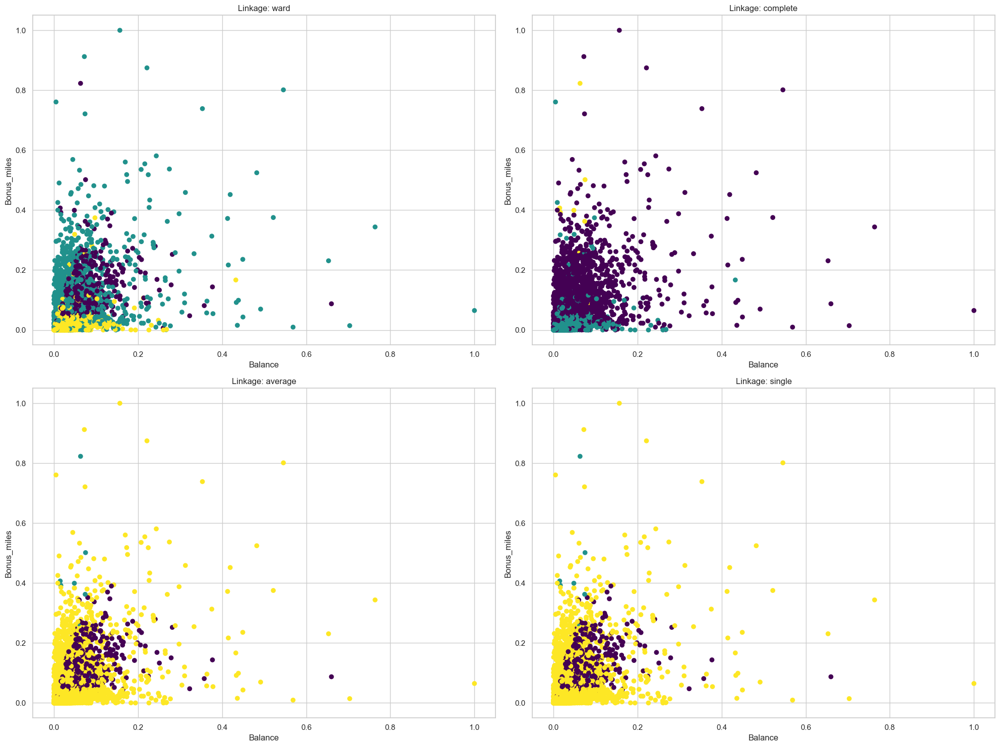

In [67]:
# Experiment with different linkage criteria for Hierarchical Clustering
linkage_criteria = ['ward', 'complete', 'average', 'single']

plt.figure(figsize=(20, 15))

# Assuming scaled_df is your DataFrame and contains the data for clustering
for i, linkage in enumerate(linkage_criteria, 1):
    hierarchical = AgglomerativeClustering(n_clusters=3, linkage=linkage)
    # Fit the model and predict clusters
    scaled_df[f'Hierarchical_Cluster_{linkage}'] = hierarchical.fit_predict(scaled_df)

    # Scatter plot using column names
    plt.subplot(2, 2, i)
    plt.scatter(scaled_df['Balance'], scaled_df['Bonus_miles'], c=scaled_df[f'Hierarchical_Cluster_{linkage}'], cmap='viridis')
    plt.title(f'Linkage: {linkage}')
    plt.xlabel('Balance')
    plt.ylabel('Bonus_miles')

plt.tight_layout()

plt.show()

**Linkage Clustering Observations:**

- *Ward & Complete Linkage*: Both methods show dense clustering near the origin low balance and low bonus miles, with more spread in Complete Linkage, indicating different groups form based on distant points.
- *Average Linkage*: Reveals wider spread in clusters, especially for higher bonus miles, suggesting greater sensitivity to average distances between points.
- *Single Linkage*: Exhibits more sparse and elongated clusters, with some distant points forming loose connections, reflecting the tendency to link nearest neighboring points.

### Expriments for DBSCAN using Grid Search


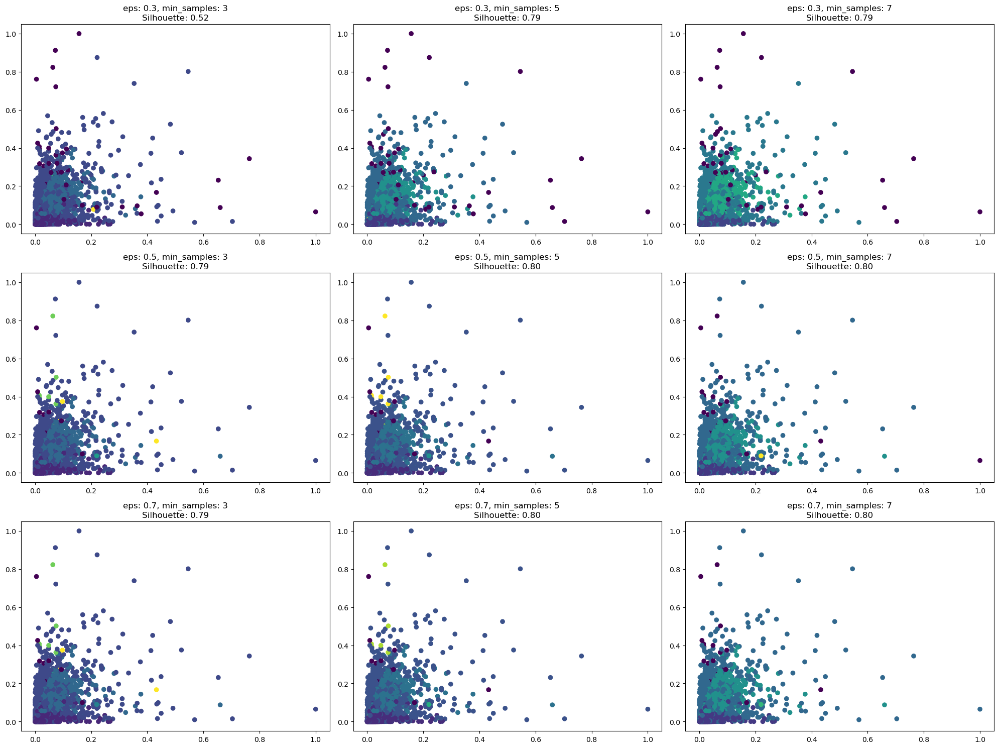

In [22]:
# Define the range of parameters for DBSCAN
eps_values = [0.3, 0.5, 0.7]
min_samples_values = [3, 5, 7]

plt.figure(figsize=(20, 15))
plot_num = 1

# Assuming scaled_df is your DataFrame
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(scaled_df)
        silhouette_avg = silhouette_score(scaled_df, labels) if len(set(labels)) > 1 else -1
        
        plt.subplot(len(eps_values), len(min_samples_values), plot_num)
        plt.scatter(scaled_df['Balance'], scaled_df['Bonus_miles'], c=labels, cmap='viridis')
        plt.title(f'eps: {eps}, min_samples: {min_samples}\nSilhouette: {silhouette_avg:.2f}')
        plot_num += 1

plt.tight_layout()
plt.show()

**DBSCAN Clustering Observations:**

- *Silhouette Scores*: Higher eps values (0.5, 0.7) and increased min_samples consistently lead to better silhouette scores (0.79-0.80), indicating tighter and more distinct clusters as density-based parameters increase.
- *Cluster Spread*: As min_samples increases (from 3 to 7), clusters become more defined, reducing noise points and improving separation, especially visible in higher eps plots.
- *Cluster Formation*: Lower eps (0.3) results in more noise and dispersed clusters, while higher eps (0.5, 0.7) shows denser core clusters with better formation and less overlap between groups.


## Evaluation of model based on origanl dataset and optimze version 

In [133]:
from sklearn.metrics import silhouette_score


### Orignal dataset 

In [124]:

# Calculate silhouette scores
kmeans_silhouette = silhouette_score(scaled_df, scaled_df['KMeans_Cluster'])
hierarchical_silhouette = silhouette_score(scaled_df, scaled_df['Hierarchical_Cluster'])
dbscan_silhouette = silhouette_score(scaled_df, scaled_df['DBSCAN_Cluster'])
# Calculate silhouette score for Hierarchical Clustering


# Display the silhouette scores
print(f"K-Means = {kmeans_silhouette}\nHierarchical = {hierarchical_silhouette} \nDBSCAN = {dbscan_silhouette}")



K-Means = 0.7882257936735824
Hierarchical = 0.8075952602764458 
DBSCAN = 0.79537727274916


- **Hierarchical Clustering** outperformed the other methods with the highest silhouette score of **0.8076**, indicating the best-defined clusters.
- **DBSCAN** followed closely with a score of **0.7954**, showing good clustering performance, particularly in handling non-linear shapes.
- **K-Means** had the lowest score of **0.7882**, suggesting it may not capture the underlying structure of the data as effectively as the other methods.


### optimze number of cluster for model 

In [76]:
# K-Means Clustering
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans__opt_label = kmeans.fit_predict(scaled_df)

In [131]:
kmeans_opt_silhouette = silhouette_score(scaled_df, kmeans__opt_label)

In [92]:
# Hierarchical Clustering
hierarchical = AgglomerativeClustering(n_clusters=4)
hierarchical_opt_label = hierarchical.fit_predict(scaled_df)

In [130]:
hierarchical_opt_silhouette = silhouette_score(scaled_df, hierarchical_opt_label)

In [107]:
# DBSCAN Clustering
dbscan = DBSCAN(eps=0.5, min_samples=7)
dbscan_opt_label= dbscan.fit_predict(scaled_df)

In [129]:
dbscan_opt_silhouette = silhouette_score(scaled_df, dbscan_opt_label)

In [132]:
print(f"K-Means = {kmeans_opt_silhouette}\nHierarchical = {hierarchical_opt_silhouette} \nDBSCAN = {dbscan_opt_silhouette}")


K-Means = 0.8156596612349167
Hierarchical = 0.8157003787583277 
DBSCAN = 0.8023355491890196


#### Conclusion for Optimized Cluster Value

- Hierarchical clustering achieved the highest silhouette score of **0.815700** with the  cluster value 4, indicating it provided the best clustering performance among the methods tested.
- K-Means also showed strong performance with a score of **0.815660** with cluster value of 4, demonstrating effective optimization.
- DBSCAN scored **0.802336** with the cluster value of eps=0.5, min_samples=7, indicating decent performance, but it lagged behind both Hierarchical and K-Means in this evaluation.


# Implementing Clustering Algorithms on Cleaned Dataset(Outliers Handling)

### feature Scaling on cleaned data

In [110]:
# Apply scaling to the dataframe
cleaned_scaled_df = pd.DataFrame(scaler.fit_transform(cleaned_df), columns=cleaned_df.columns)

# Display the first few rows of the scaled dataframe
cleaned_scaled_df.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,0.138486,0.0,0.00,0.0,0.0,0.003019,0.026316,0.0,0.0,0.843742,0.0
1,0.094696,0.0,0.00,0.0,0.0,0.003731,0.052632,0.0,0.0,0.839884,0.0
2,0.203495,0.0,0.00,0.0,0.0,0.071547,0.105263,0.0,0.0,0.847842,0.0
3,0.072710,0.0,0.00,0.0,0.0,0.008677,0.026316,0.0,0.0,0.837955,0.0
4,0.481019,0.0,0.75,0.0,0.0,0.751394,0.684211,1.0,1.0,0.835905,1.0


### K-means Cluseting 

In [114]:
# K-Means Clustering
kmeans = KMeans(n_clusters=3, random_state=42)
cleaned_scaled_df['KMeans_Cluster'] = kmeans.fit_predict(cleaned_scaled_df)

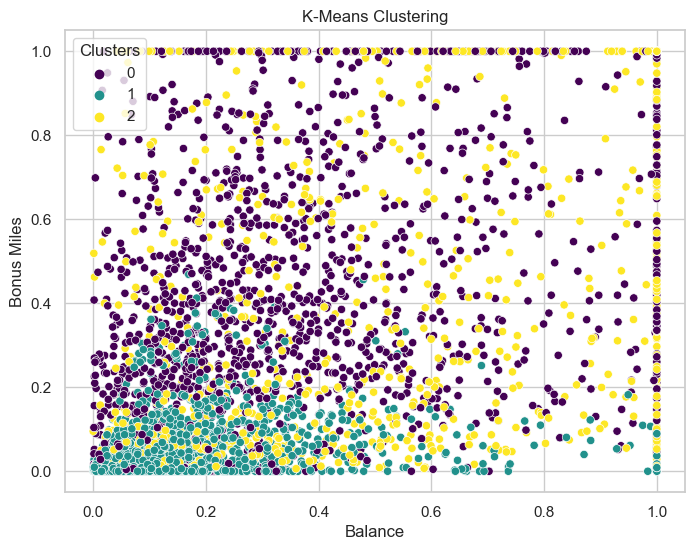

In [115]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Balance', y='Bonus_miles', hue='KMeans_Cluster', palette='viridis', data=cleaned_scaled_df)
plt.title('K-Means Clustering')
plt.xlabel('Balance')
plt.ylabel('Bonus Miles')
plt.legend(title='Clusters')
plt.show()

The clusters are reasonably well-separated, suggesting that the algorithm was able to distinguish between customers with different characteristics.The plot clearly shows three distinct clusters

### Hierarchical Clustering

In [116]:
# Hierarchical Clustering
hierarchical = AgglomerativeClustering(n_clusters=3)
cleaned_scaled_df['Hierarchical_Cluster'] = hierarchical.fit_predict(cleaned_scaled_df)

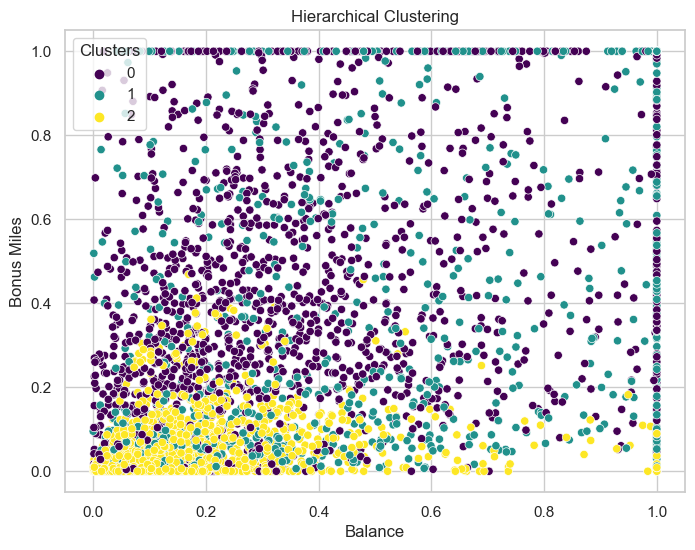

In [117]:
# Hierarchical Clustering Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Balance', y='Bonus_miles', hue='Hierarchical_Cluster', palette='viridis', data=cleaned_scaled_df)
plt.title('Hierarchical Clustering')
plt.xlabel('Balance')
plt.ylabel('Bonus Miles')
plt.legend(title='Clusters')
plt.show()

- **Effective Customer Segmentation**: Hierarchical clustering successfully identified three distinct customer segments, demonstrating its ability to effectively segment based on "Balance" and "Bonus Miles."
- **Separation**: The clusters are well-separated and compact, indicating that customers within each segment share similar characteristics, which warrants further analysis of these attributes.

### DBSCAN Clustering


In [118]:
# DBSCAN Clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
cleaned_scaled_df['DBSCAN_Cluster'] = dbscan.fit_predict(cleaned_scaled_df)

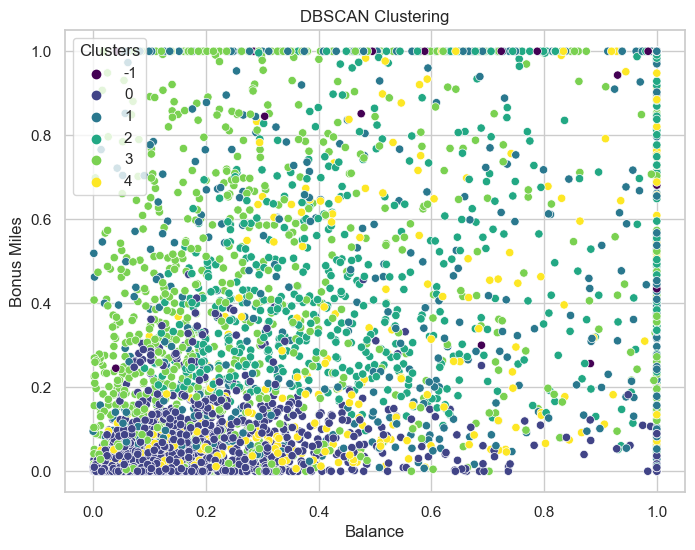

In [119]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Balance', y='Bonus_miles', hue='DBSCAN_Cluster', palette='viridis', data=cleaned_scaled_df)
plt.title('DBSCAN Clustering')
plt.xlabel('Balance')
plt.ylabel('Bonus Miles')
plt.legend(title='Clusters')
plt.show()

- **Segmentation**: DBSCAN successfully identified distinct customer segments, demonstrating its capability to group customers based on "Balance" and "Bonus Miles."
- **Outlier Detection**: The algorithm effectively identified outliers (labeled as "-1"), providing insights into potential anomalies that warrant further investigation.

# Evaluation of clustering algorithm affter handling outliers 

In [123]:

# Calculate silhouette scores
kmeans_cleaned_silhouette = silhouette_score(cleaned_scaled_df, cleaned_scaled_df['KMeans_Cluster'])
hierarchical_cleaned_silhouette = silhouette_score(cleaned_scaled_df, cleaned_scaled_df['Hierarchical_Cluster'])
dbscan_cleaned_silhouette = silhouette_score(cleaned_scaled_df, cleaned_scaled_df['DBSCAN_Cluster'])
# Calculate silhouette score for Hierarchical Clustering

# Display the silhouette scores
print(f"K-Means = {kmeans_cleaned_silhouette}\nHierarchical = {hierarchical_cleaned_silhouette} \nDBSCAN = {dbscan_cleaned_silhouette}")


K-Means = 0.6250816368438691
Hierarchical = 0.6250816368438691 
DBSCAN = 0.6497700929970389


**We can see that outiler handling is not working in clustering algorithms**

# Comparing All model result to find out best out of it 

In [126]:
Evaluation = {
    'Evaluation Type': [
        'Original Dataset',
        'Optimized Cluster Value',
        'Cleaned Dataset (after handling outliers)'
    ],
    'K-Means': [
        kmeans_silhouette,
        kmeans_opt_silhouette,
        kmeans_cleaned_silhouette
    ],
    'Hierarchical': [
        hierarchical_silhouette,
        hierarchical_opt_silhouette,
        hierarchical_cleaned_silhouette
    ],
    'DBSCAN': [
        dbscan_silhouette,
        dbscan_opt_silhouette,
        dbscan_cleaned_silhouette
    ]
}

In [127]:
evaluation_df = pd.DataFrame(Evaluation)

In [128]:
evaluation_df

,Evaluation Type,K-Means,Hierarchical,DBSCAN
0,Original Dataset,0.788226,0.807595,0.795377
1,Optimized Cluster Value,0.815660,0.815700,0.802336
2,Cleaned Dataset (after handling outliers),0.625082,0.625082,0.649770


## Analysis

1. **Original Dataset**:
   - Hierarchical clustering performed slightly better than K-Means and DBSCAN, with a silhouette score of **0.807595**.
   - All methods yielded relatively high scores, indicating good clustering performance.

2. **Optimized Cluster Value**:
   - The silhouette scores for all methods improved compared to the original dataset, suggesting that the optimization of cluster values positively impacted clustering quality.
   - Hierarchical clustering remains the best-performing method, with a score of **0.815700**, closely followed by K-Means at **0.815660**.

3. **Cleaned Dataset**:
   - There is a noticeable drop in silhouette scores across all methods after handling outliers, with K-Means and Hierarchical both at **0.625082** and DBSCAN at **0.649770**.
   - This decrease may indicate that while outlier removal can help with the overall integrity of the dataset, it may have also reduced the density of the clusters, thus impacting performance.



## Conclusion

- Overall, Hierarchical clustering consistently performed well across different evaluations, particularly in the optimized cluster scenario.
- K-Means showed competitive results, especially after optimization, but its performance declined more significantly when outliers were removed.
- DBSCAN maintained decent performance but did not outperform the other two methods in any scenario.